# 5b. Epithelial cell pellet quantification
## 1. Summary
This notebook quantifies channel features and generates the figures associated with the XRF epithelial cell pellet scans comprising Figure 2 and Figure 3 in the MEZ-XRF paper.

The input requires This includes quantifying cell features per channel using the image stack and according to the cell and nuclei segmentation masks generated in the `4a_cell_segmentation` notebook. Both the image stack and masks are held in the hdf outputs of 4a.

In [1]:
import pathlib
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import squidpy as sq

import h5py
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
from shutil import copyfile

import sys
sys.path.insert(0, '..\\code\\')
import high_plex_hdf as hph
import hph_adata_analysis as hph_adata

In [2]:
# Set data directory to work from 
base_dir = "C:/Users/MerrickS/OneDrive/Work/2_UZH/Papers/1_MEZ_XRF"
base_dir = pathlib.Path(base_dir)
base_dir_sub = base_dir / 'data' / 'processed' / 'xrf'

# Specify the input directory containing hdf deconvoluted files
deconv_dir = base_dir_sub / '2_deconvoluted_hdfs' / 'summary_hdfs'

# Specify the input directory containing hdf files of images and masks
hdf_dir = base_dir_sub / '5a_cell_segmentation'

# Make output directory segmented images
out_dir = base_dir_sub / '5b_cell_pellet_quantification'
out_dir.mkdir(parents=True, exist_ok=True)
print('Quantified hdf files will be output to: \n\t', out_dir) 

# Read in scans and original scan metadata
df_hdf_files = pd.read_csv(base_dir_sub / '1_reduced_reshaped_hdfs' / 'preprocessed_hdf_config_files.csv')
df_hdf_metadata = pd.read_csv(base_dir_sub / '1_reduced_reshaped_hdfs' / 'xrf_scan_metadata_full.csv')

# Import periodic table csv
df_periodic_table = pd.read_csv(base_dir / 'data' / 'raw' / 'xrf' / 'Periodic Table of Elements.csv')

Quantified hdf files will be output to: 
	 C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\5b_cell_pellet_quantification


Identifiy the hdf files to analyse

In [3]:
samples_dict = {
    'sample001_0001': 'ZR-75-1',
    'sample001_0003': 'MCF10a',
    '001_002_stitch': 'A431',
    '001_004_stitch': 'SKBR3'
    }

hdf_filepaths = []
for sample in samples_dict:
    hdf_filepaths.append(list(hdf_dir.glob(f'{sample}*.h5'))[0])

In [4]:
for hdf_fpath in hdf_filepaths[:1]:
    with h5py.File(hdf_fpath, 'r') as hdf:
        print(hdf['images'].keys())
        print(hdf['masks'].keys())

<KeysViewHDF5 ['1_compton_norm', '2_beam_intensity_norm', 'df_channel_metadata', 'raw']>
<KeysViewHDF5 ['fpico_mask', 'matched_cell_mask', 'matched_non_nuclei_mask', 'matched_nuclei_mask', 'mesmer_cell_mask', 'mesmer_nuclei_mask']>


## 2. Generate annotated data (anndata) objects based on selected image set and selected masks
Create a merged anndata object of using whole cell, nuclear and non-nuclear masks for the cell pellet set of hdf files.

In [5]:
image_n = '2_beam_intensity_norm'

mask_n = 'matched_cell_mask'
adata = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata.write(out_dir.joinpath('cell_pellets_adata_matched_cell.h5ad'))

mask_n = 'matched_nuclei_mask'
adata = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata.write(out_dir.joinpath('cell_pellets_adata_matched_nuclei.h5ad'))

mask_n = 'matched_non_nuclei_mask'
adata = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata.write(out_dir.joinpath('cell_pellets_adata_matched_non_nuclei.h5ad'))

... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical
... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical


## 3. Generate channel summary images
Reference for each hdf image mask container is stored in the unstructured aspect of `anndata adata.uns['hdf_container_path']`. Images are imported from these hdf containers, which are index matched to variable annotations stored in `adata.var`.

In [6]:
plot_channels= [
    'Ag_Ka', 
    'Ce_Ka', 
    'Dy_Ka', 
    'Er_L3', 
    'Eu_Ka', 
    'Gd_Ka', 
    'Ho_Ka', 
    'I_Ka',
    'In_Ka', 
    'Ir_L3', 
    'La_Ka', 
    'Lu_L3', 
    'Nd_Ka', 
    'Pr_Ka', 
    'Sm_Ka', 
    'Tb_Ka',
    'Tm_L3', 
    'Y_Ka', 
    'Yb_L3'
]

# fig_channels_1= [
#     'In_Ka', 
#     'Eu_Ka', 
#     'Yb_L3', 
#     'I_Ka', 
#     'Y_Ka', 
#     'Tm_L3', 
# ]

fig_channels_2= [
    'In_Ka',
    'Eu_Ka',
    'Yb_L3',
    'I_Ka',
    'Y_Ka',
    'Ce_Ka',
    'Tm_L3', 
    'Tb_Ka', 
    'La_Ka',
    'Pr_Ka',
    'Nd_Ka',
    'Gd_Ka',
    'Ag_Ka',
]

fig_channels_3 = [
    'Tb_Ka', 
    'La_Ka',
    'Pr_Ka',
    'Nd_Ka', 
    'Gd_Ka',
    'Ag_Ka',

]


C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\5b_cell_pellet_quantification\Fig2A-M.svg


..\code\hph_adata_analysis.py:395: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(tick_labels_padded)  # vertically oriented colorbar


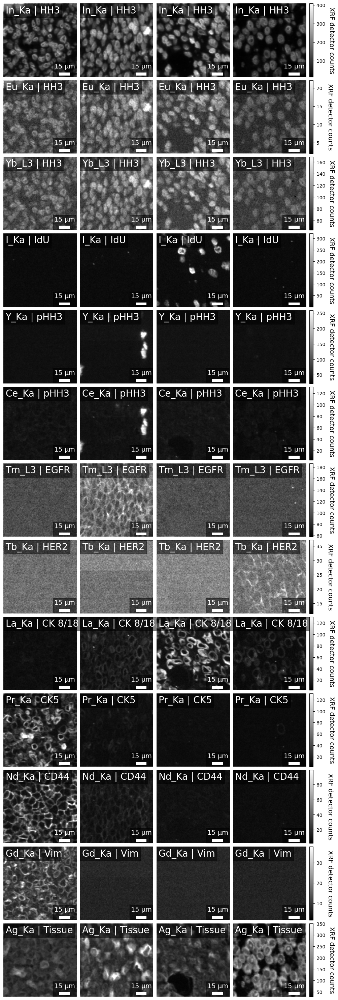

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\5b_cell_pellet_quantification\Fig2extrapanels.pdf


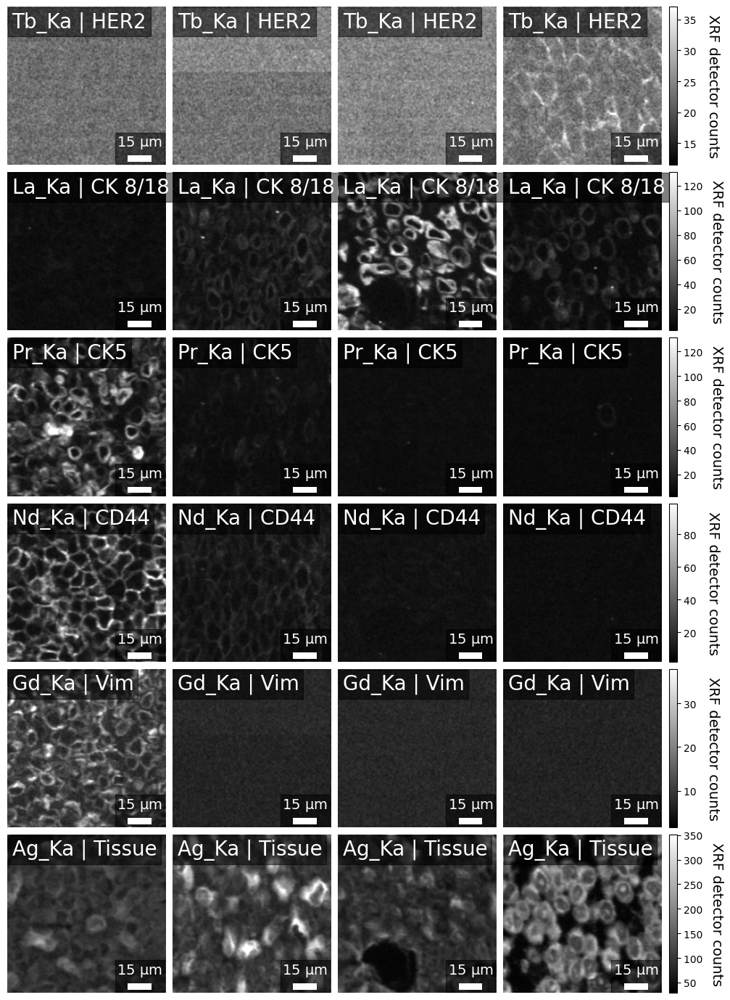

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\5b_cell_pellet_quantification\AllChannels.pdf


..\code\hph_adata_analysis.py:395: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(tick_labels_padded)  # vertically oriented colorbar


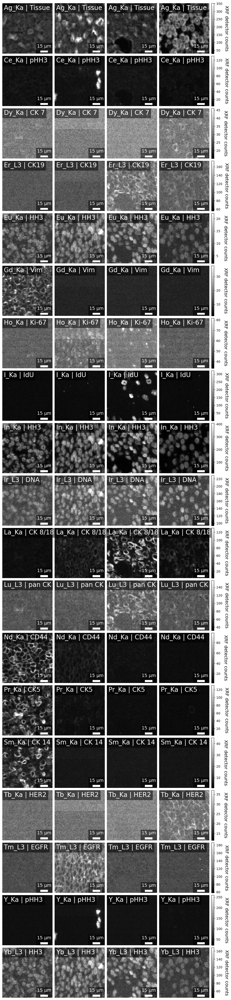

In [9]:
from importlib import reload  # Python 3.4+
reload(hph_adata)

save_name = str(out_dir / 'Fig2A-M.svg')
print(save_name)
hph_adata.adata_hph_channels_plot(
    adata, 
    plot_name='longname', 
    plot_channels=fig_channels_2,
    hdf_ids = [
        'MCF10a',
        'A431',
        'ZR-75-1',
        'SKBR3'        
    ],
    hdf_image_key='raw',
    save_name = save_name
)

save_name = str(out_dir / 'Fig2extrapanels.pdf')
print(save_name)
hph_adata.adata_hph_channels_plot(
    adata, 
    plot_name='longname', 
    plot_channels=fig_channels_3,
    hdf_ids = [
        'MCF10a',
        'A431',
        'ZR-75-1',
        'SKBR3'        
    ],
    hdf_image_key='raw',
    save_name = save_name
)

save_name = str(out_dir / 'AllChannels.pdf')
print(save_name)
hph_adata.adata_hph_channels_plot(
    adata, 
    plot_name='longname', 
    plot_channels=plot_channels,
    hdf_ids = [
        'MCF10a',
        'A431',
        'ZR-75-1',
        'SKBR3'        
    ],
    hdf_image_key='raw',
    save_name = save_name
)

## 4. Mesmer input and output

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\5b_cell_pellet_quantification\Fig2N.svg


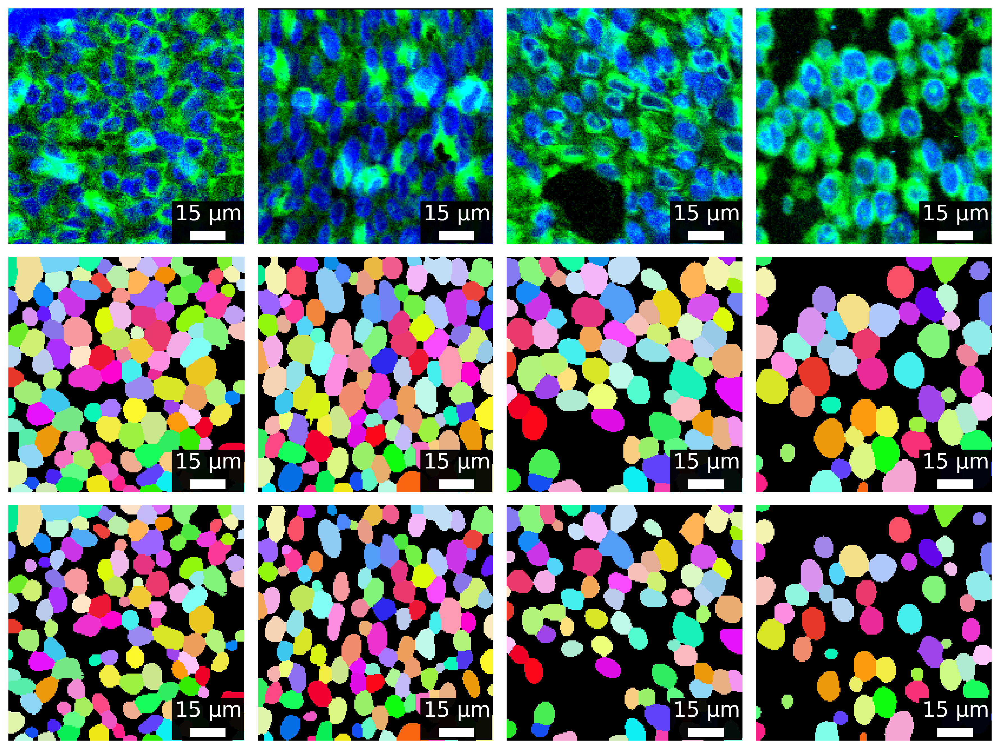

In [12]:
from matplotlib_scalebar.scalebar import ScaleBar
from deepcell.utils.plot_utils import create_rgb_image
from utilities import aggregate_images, rand_cmap

adata = ad.read_h5ad(out_dir.joinpath('cell_pellets_adata_matched_cell.h5ad'))
hph_dict = hph_adata.adata_uns_hdf_fpaths(adata)

save_name = str(out_dir / 'Fig2N.pdf')
print(save_name)


fig, axes = plt.subplots(ncols=4, nrows=3, figsize=(12,9), dpi=300)
#axs = axes.ravel()

hdf_ids_order=['MCF10a', 'A431', 'ZR-75-1', 'SKBR3']


for col, sample in enumerate(hph_dict.keys()):
    sample = hdf_ids_order[col]
    
    sample_hph = hph.hdf_to_HighPlex_Hdf(hph_dict[sample])
    
    sample_hph.nuclear_channel_img()
    nuc_img = sample_hph.nuclear_avg_channel
    nuc_img = np.expand_dims(nuc_img, axis=0)

    sample_hph.cell_channel_img()
    cell_img = sample_hph.cell_avg_channel
    cell_img = np.expand_dims(cell_img, axis=0)

    rgb_image = np.stack([nuc_img, cell_img], axis=-1)
    rgb_image = create_rgb_image(rgb_image, channel_colors=['blue', 'green'])
    rgb_image = rgb_image[0, :, :, :]
    
    axes[0, col].imshow(rgb_image)
    
    cell_mask = sample_hph.masks['matched_cell_mask']
    nuc_mask = sample_hph.masks['matched_nuclei_mask']
    
    cmap = rand_cmap(
        len(nuc_mask), 
        type='bright', 
        first_color_black=True, 
        last_color_black=False, 
        verbose=False
    )
    
    axes[1, col].imshow(cell_mask, cmap=cmap)
    axes[2, col].imshow(nuc_mask, cmap=cmap)
    
    for ax in axes.flatten():
        ax.axis('off')
        scalebar = ScaleBar(
            sample_hph.sample_metadata['step_um'], 
            "um", 
            #fixed_value=200, 
            location='lower right', 
            width_fraction=0.04, 
            color='white', 
            scale_loc='top',
            box_alpha=0.5, 
            box_color='black',
            font_properties = {'size':18}
        )            
        ax.add_artist(scalebar)
    
    #print(col, sample)
plt.tight_layout()
plt.savefig(save_name, bbox_inches='tight')
plt.show()



    

## 5. Marker correlation 
The following section measures and plots the marker correlation for select markers that are present in replicates.

In [9]:
adata = ad.read_h5ad(out_dir.joinpath('cell_pellets_adata_matched_cell.h5ad'))

{'Ce_Ka': 'Ce_Ka | pHH3', 'Y_Ka': 'Y_Ka | pHH3', 'Ag_Ka': 'Ag_Ka | Tissue', 'In_Ka': 'In_Ka | HH3', 'Eu_Ka': 'Eu_Ka | HH3', 'Yb_L3': 'Yb_L3 | HH3', 'Ir_L3': 'Ir_L3 | DNA'}


C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\5b_cell_pellet_quantification\Fig2O_HeatMapColocalisation.svg


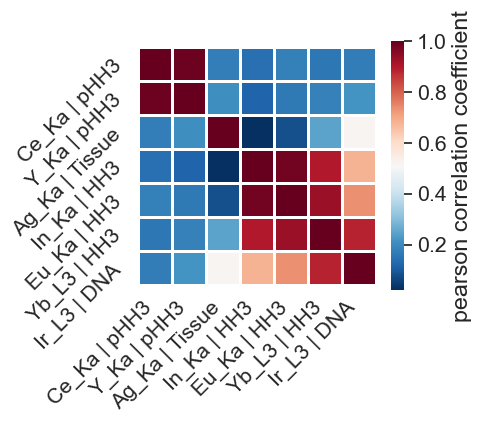

In [13]:
repeat_channels = [
    'Ce_Ka', 
    'Y_Ka', 
    'Ag_Ka',
    'In_Ka', 
    'Eu_Ka', 
    'Yb_L3', 
    'Ir_L3',
    ]

labels = {}
for label in repeat_channels:
    labels[label] = adata.var.longname[adata.var.index == label].iloc[0]
print(labels)    

df_sc_mean = adata[:, repeat_channels].to_df()
df_channel_correlation = df_sc_mean.corr()

sns.set(font_scale=1.4)

fig, ax = plt.subplots(figsize=(5,5), dpi=100)
sns.heatmap(df_channel_correlation,
            cmap='RdBu_r', 
            xticklabels = labels.values(),
            yticklabels = labels.values(),
#             annot=True,
            square = True,
            ax=ax,
            linewidths=2,
            cbar_kws={
                'shrink': 0.7,
                'label': 'pearson correlation coefficient'
            },
            #vmin=-1,
            #vmax=1
            )


# ADDED: Remove labels.
ax.set_ylabel('')    
ax.set_xlabel('')
xlabels = ax.get_xticklabels() 
ax.set_xticklabels(xlabels, rotation=45, ha='right')#, fontsize = 14)
ax.set_yticklabels(xlabels, rotation=45, ha='right')#, fontsize = 14)

# g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xmajorticklabels(), fontsize = 16)
savename = out_dir / 'Fig2O_HeatMapColocalisation.svg'
print(savename)
plt.savefig(savename, bbox_inches='tight')

plt.tight_layout()
plt.show()

## 6. Subcellular localisation
The following section measures the subcellular localisation of markers (nuclear or non-nuclear).

In [14]:
adata_nuc = ad.read_h5ad(out_dir.joinpath('cell_pellets_adata_matched_nuclei.h5ad'))
adata_non_nuc = ad.read_h5ad(out_dir.joinpath('cell_pellets_adata_matched_non_nuclei.h5ad'))

assert adata_nuc.shape == adata_non_nuc.shape

region_measures = [
    'label_id',
    'sample',
    'channel',
    'longname',
    'nuclear_mean_counts',
    'non_nuclear_mean_counts'
]

# Build dataframe of matched nuclear and non-nuclear measurements
df_nuc_non_nuc = pd.DataFrame(columns=region_measures)
for event in adata_nuc.obs.index:
    region_measures=dict.fromkeys(region_measures)  
    region_measures['label_id'] = event
    
    event_nuc_measures = adata_nuc[adata_nuc.obs.index == event]
    event_non_nuc_measures = adata_non_nuc[adata_non_nuc.obs.index == event]
    region_measures['sample'] = adata_nuc.obs['sample_name_ref'][
        adata_nuc.obs.index == event
    ].iloc[0]
    
    for channel in adata_nuc.var.index:
        region_measures['channel'] = channel
        region_measures['longname'] = adata_nuc.var.longname[
            adata_nuc.var.index == channel
        ].iloc[0]
        
        region_measures['nuclear_mean_counts'] = event_nuc_measures[:, channel].X[0][0]
        region_measures['non_nuclear_mean_counts'] = event_non_nuc_measures[:, channel].X[0][0]
        
        df_nuc_non_nuc = df_nuc_non_nuc.append(region_measures, ignore_index=True)


In [15]:
# Evaluate nuclear and non-nuclear ratios per marker
df_nuc_non_nuc['nuclear/non_nuclear'] = (
    df_nuc_non_nuc['nuclear_mean_counts'] / 
    df_nuc_non_nuc['non_nuclear_mean_counts']
)

df_nuc_non_nuc['log2(nuclear/non-nuclear)'] = (
    df_nuc_non_nuc['nuclear/non_nuclear'].apply(np.log2)    
)

# Reindex markers according to average expression of the channel
rank_df_nuc_non_nuc = df_nuc_non_nuc.groupby(['channel']).mean()
rank_df_nuc_non_nuc = rank_df_nuc_non_nuc.sort_values('log2(nuclear/non-nuclear)').reset_index()

channel_list = rank_df_nuc_non_nuc['channel'].to_list()
channel_order = dict(zip(channel_list, range(len(channel_list))))

df_nuc_non_nuc['rank'] = df_nuc_non_nuc['channel'].map(channel_order)
df_nuc_non_nuc = df_nuc_non_nuc.sort_values('rank').reindex()


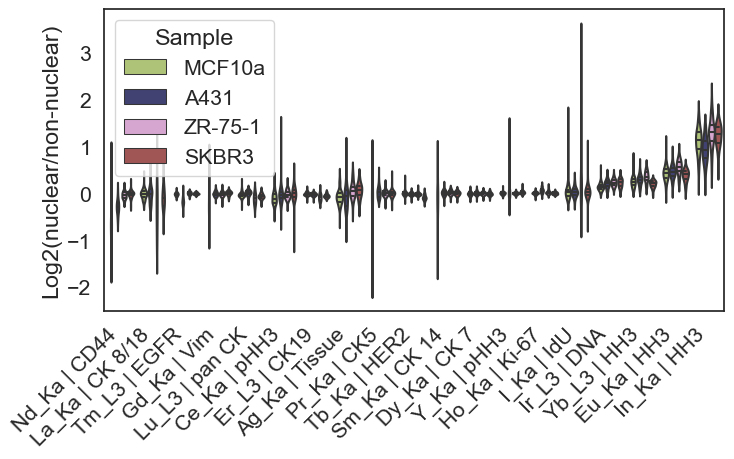

In [16]:
from matplotlib.collections import PolyCollection
palette=['#b5cf6b', '#393b79', '#de9ed6', '#ad494a']
sns.set_style("white")

fig, axs = plt.subplots(dpi=100, figsize=(8,4))

sns.violinplot(
    data = df_nuc_non_nuc,
    x = 'longname',
    y = 'log2(nuclear/non-nuclear)',       
    hue = 'sample',
    hue_order = ['MCF10a', 'A431', 'ZR-75-1', 'SKBR3'],
    palette=palette,
    ax=axs,  
    inner='quartiles'
    )

xlabels = axs.get_xticklabels() 
axs.set(xlabel='', ylabel='Log2(nuclear/non-nuclear)')
plt.xticks(rotation=45, ha='right')

violins = [art for art in ax.get_children() if isinstance(art, PolyCollection)]
n=4
colors = sns.color_palette(palette, n_colors=n) * (len(violins)//n)
for i in range(len(violins)):
    violins[i].set_edgecolor(colors[i])

plt.legend(title='Sample')
plt.show()

### Subcellular localisation enriched counts

In [17]:
# Build dataframe of top percentage cells per cell type
percentage = 10

# Add total counts
df_nuc_non_nuc['total_counts'] = df_nuc_non_nuc['nuclear_mean_counts'] + df_nuc_non_nuc['non_nuclear_mean_counts']  

# Drop zero counts
df_nuc_non_nuc = df_nuc_non_nuc[df_nuc_non_nuc['nuclear_mean_counts'] != 0]
df_nuc_non_nuc = df_nuc_non_nuc[df_nuc_non_nuc['non_nuclear_mean_counts'] != 0]

df_nuc_non_nuc_enriched = pd.DataFrame()
for sample in df_nuc_non_nuc['sample'].unique()[:]:
    df_nuc_non_nuc_sample = df_nuc_non_nuc[df_nuc_non_nuc['sample'] == sample]

    for longname in df_nuc_non_nuc['longname'].unique()[:]:
        df_nuc_non_nuc_sample_marker = df_nuc_non_nuc_sample[df_nuc_non_nuc_sample['longname'] == longname]

        cell_sample = int((len(df_nuc_non_nuc_sample_marker) / 100) * percentage)
        df_append = df_nuc_non_nuc_sample_marker.sort_values('total_counts').iloc[-cell_sample:,:]
        
        if df_nuc_non_nuc_enriched.empty:
            df_nuc_non_nuc_enriched = df_append
        else:
            df_nuc_non_nuc_enriched = pd.concat([df_nuc_non_nuc_enriched, df_append], ignore_index=True)
        
# Reindex markers according to average expression of the channel
rank_df_nuc_non_nuc_enriched = df_nuc_non_nuc_enriched.groupby(['longname']).mean()
rank_df_nuc_non_nuc_enriched = rank_df_nuc_non_nuc_enriched.sort_values('log2(nuclear/non-nuclear)').reset_index()

channel_list = rank_df_nuc_non_nuc_enriched['longname'].to_list()
channel_order = dict(zip(channel_list, range(len(channel_list))))

rank_df_nuc_non_nuc_enriched['rank'] = rank_df_nuc_non_nuc_enriched['longname'].map(channel_order)
rank_df_nuc_non_nuc_enriched = rank_df_nuc_non_nuc_enriched.sort_values('rank').reindex()

channel_list = rank_df_nuc_non_nuc_enriched['longname'].to_list()
channel_order = dict(zip(channel_list, range(len(channel_list))))

df_nuc_non_nuc_enriched['rank'] = df_nuc_non_nuc_enriched['longname'].map(channel_order)
df_nuc_non_nuc_enriched = df_nuc_non_nuc_enriched.sort_values('rank').reindex()

df_nuc_non_nuc_enriched

,label_id,sample,channel,longname,nuclear_mean_counts,non_nuclear_mean_counts,nuclear/non_nuclear,log2(nuclear/non-nuclear),rank,total_counts
0,2-79,A431,Nd_Ka,Nd_Ka | CD44,0.000017,0.000021,0.818662,-0.288660,0,0.000038
534,0-43,ZR-75-1,Nd_Ka,Nd_Ka | CD44,0.000011,0.000012,0.872347,-0.197027,0,0.000023
533,0-28,ZR-75-1,Nd_Ka,Nd_Ka | CD44,0.000011,0.000012,0.896142,-0.158201,0,0.000023
532,0-2,ZR-75-1,Nd_Ka,Nd_Ka | CD44,0.000012,0.000011,1.023221,0.033118,0,0.000023
210,3-8,SKBR3,Nd_Ka,Nd_Ka | CD44,0.000011,0.000012,0.915072,-0.128042,0,0.000024
...,...,...,...,...,...,...,...,...,...,...
203,2-42,A431,In_Ka,In_Ka | HH3,0.000572,0.000329,1.737966,0.797400,18,0.000901
201,2-93,A431,In_Ka,In_Ka | HH3,0.000575,0.000272,2.112078,1.078663,18,0.000847
200,2-77,A431,In_Ka,In_Ka | HH3,0.000530,0.000306,1.733792,0.793931,18,0.000836
527,1-51,MCF10a,In_Ka,In_Ka | HH3,0.000559,0.000219,2.552011,1.351635,18,0.000778


### Enriched signal localisation comparison

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\5b_cell_pellet_quantification\Fig2S_CellMarkerDistribution.svg


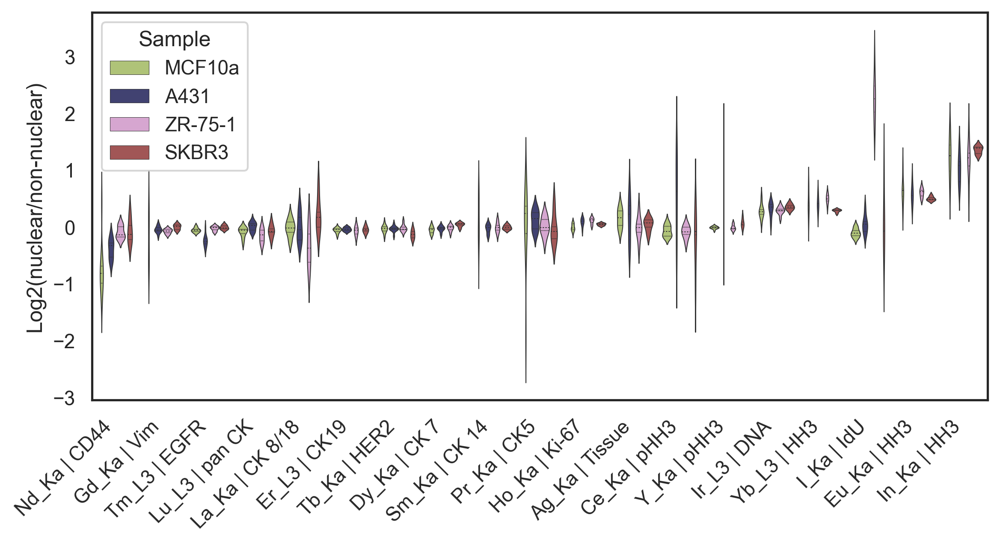

In [18]:
palette=['#b5cf6b', '#393b79', '#de9ed6', '#ad494a']
sns.set(font_scale=1)
sns.set_style("white")

fig, axs = plt.subplots(dpi=300, figsize=(9,4))

sns.violinplot(
    data = df_nuc_non_nuc_enriched,
    x = 'longname',
    y = 'log2(nuclear/non-nuclear)',       
    hue = 'sample',
    hue_order = ['MCF10a', 'A431', 'ZR-75-1', 'SKBR3'],
    palette=palette,
    ax=axs,  
    inner='quartiles',
    linewidth=0.5
    )

xlabels = axs.get_xticklabels() 
axs.set(xlabel='', ylabel='Log2(nuclear/non-nuclear)')
plt.xticks(rotation=45, ha='right')

violins = [art for art in ax.get_children() if isinstance(art, PolyCollection)]
n=4
colors = sns.color_palette(palette, n_colors=n) * (len(violins)//n)
for i in range(len(violins)):
    violins[i].set_edgecolor(colors[i])

plt.legend(title='Sample')

savename = out_dir / 'Fig2S_CellMarkerDistribution.svg'
print(savename)
plt.savefig(savename, bbox_inches='tight')

plt.show()

## 7. Cell type clustering
Specify the informative channels on which to cluster and annotate these to adata.

In [19]:
adata = ad.read_h5ad(out_dir.joinpath('cell_pellets_adata_matched_cell.h5ad'))
adata.raw = adata

cluster_channels = [
    'Ce_Ka',
    'Gd_Ka',
    'I_Ka',
    'Tb_Ka',
    'Er_L3',
    'Tm_L3'
]

cluster_channel_var = []
for i in adata.var.index: 
    cluster_channel_var.append(i in cluster_channels)
adata.var['cluster_channels'] = cluster_channel_var
adata.var['cluster_channels'] = adata.var['cluster_channels'].astype('category')

Use `cluster_channels` to make an adata subset of informative feature channels. These will be used to cluster different cell types using normalised channel counts (plotted below against raw counts). 

C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


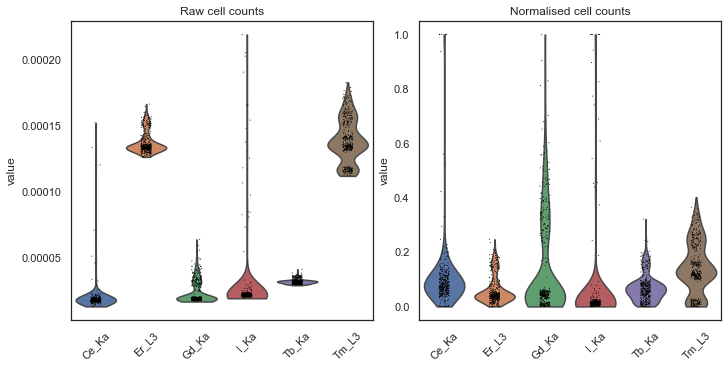

In [20]:
adata = adata[:, adata.var['cluster_channels']==True]

normalised_data = adata.X.copy()
normalised_data = hph_adata.column_percentile_normalise_test(
    normalised_data, 
    2, 
    98, 
    crop=False
)
adata.X = normalised_data

fig, axs = plt.subplots(1, 2, figsize=(10,5), constrained_layout=True)
set_xticklabels = {'labels': list(adata.var_names), 'rotation':45}
g1 = sc.pl.violin(
    adata, 
    adata.var_names, 
    ax=axs[0], 
    show=False, 
    use_raw=True,
    **set_xticklabels
    #set_xticklabels=set_xticklabels
)
g2 = sc.pl.violin(
    adata, 
    adata.var_names, 
    ax=axs[1], 
    show=False, 
    use_raw=False,
    **set_xticklabels
    #set_xticklabels=set_xticklabels
)

axs[0].title.set_text('Raw cell counts')
axs[1].title.set_text('Normalised cell counts')                      

plt.show()

Generate a principal component plot of normalised features

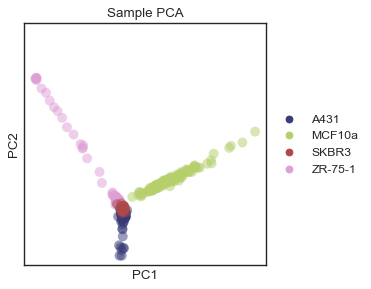

In [21]:
# Principal component analyses
sc.tl.pca(adata, svd_solver='arpack')

# Plot out principal components
fig, axs = plt.subplots(figsize=(4,4), dpi=80)
sc.pl.pca(
    adata, 
    color='sample_name_ref', 
    palette = 'tab20b',
    ax=axs, 
    title='Sample PCA', 
    show=False,
    **{'alpha':0.5}
)
plt.axis('square')
plt.show()

In [22]:
sc.pp.neighbors(adata, n_neighbors=17)
sc.tl.umap(adata, random_state=5)
sc.tl.leiden(adata, resolution=0.2)
adata.uns['leiden_colors'] = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']


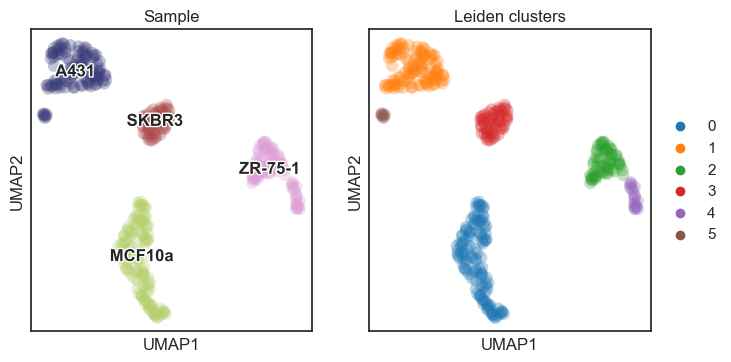

In [23]:
fig, axs = plt.subplots(1, 2, figsize=(8,4), dpi=100)#, constrained_layout=True)
sc.pl.umap(
    adata, 
    color='sample_name_ref',
    palette = 'tab20b',
    ax=axs.flatten()[0], 
    frameon=True, 
    show=False,
    legend_loc='on data',
    legend_fontoutline=2,
    title = 'Sample',
    **{'alpha':0.3}
    )
sc.pl.umap(
    adata, 
    color='leiden', 
    ax=axs.flatten()[1], 
    frameon=True, 
    show=False,
    title = 'Leiden clusters',
    **{'alpha':0.3}
    )
plt.show()

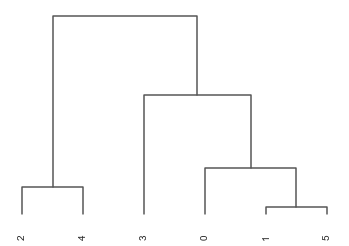

In [24]:
sc.tl.dendrogram(adata, groupby = "leiden", cor_method='spearman')
dendrogram = sc.pl.dendrogram(adata, groupby = "leiden")

Project markers onto UMAP

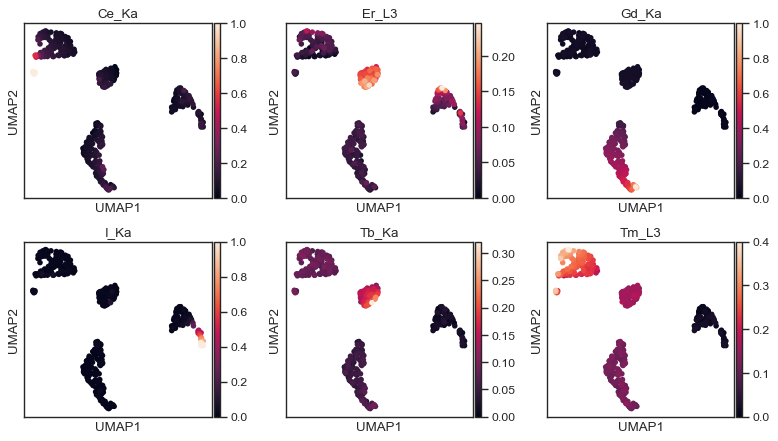

In [25]:
with rc_context({'figure.figsize': (3, 3), 'figure.dpi': 80}):
    sc.pl.umap(
        adata, 
        color=adata.var_names, 
        ncols=3, 
        # frameon=False, 
        show=False, 
        use_raw=False, 
        size=100,
        # legend='off'
    )
plt.show()

Plot ranked marker differences between leiden clusters

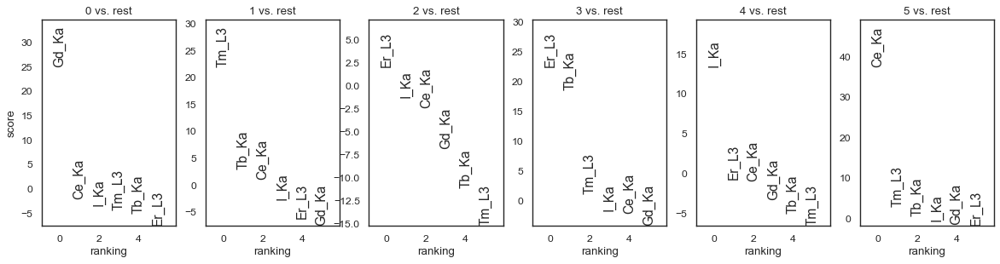

In [26]:
sc.tl.rank_genes_groups(adata, 
                        groupby='leiden', 
                        use_raw=False, 
                        method='t-test_overestim_var', 
                        # method='t-test', 
                        n_genes=6
                        ) # compute differential expression
     
with rc_context({'figure.figsize': (3, 4), 'figure.dpi': 80}):
    sc.pl.rank_genes_groups(
        adata, 
        groupby='leiden', 
        n_genes=6, 
        ncols=6, 
        sharey=False, 
        fontsize=14
    )
    
# Manually curate cluster names based on marker differences
cluster2annotation = {
     '0': 'MFC10a',
     '1': 'A431',
     '2': 'ZR-75-1',
     '3': 'SKBR3',
     '4': 'I-dU ZR-75-1',
     '5': 'mitotic A431',
}

# Annotate adata with leiden cell type cluster names
adata.obs['leiden_cluster_names'] = adata.obs['leiden'].map(cluster2annotation).astype('category')
adata.uns['leiden_cluster_names_colors'] = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']



Plot annotated leiden clusters alongside sample groundtruth

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\5b_cell_pellet_quantification\Fig2P_LeidenClusters.svg


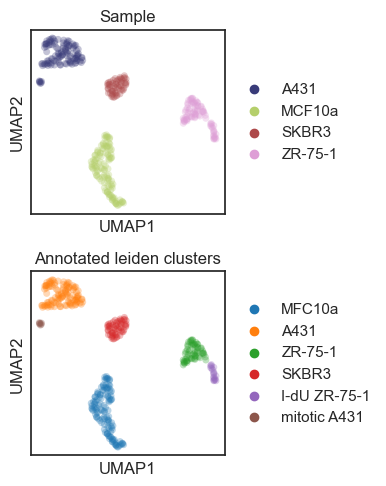

In [27]:
fig, axs = plt.subplots(2, 1, figsize=(4,5), dpi=100)#, constrained_layout=True)
sc.pl.umap(
    adata, 
    color='sample_name_ref',
    palette = 'tab20b',
    ax=axs.flatten()[0], 
    frameon=True, 
    show=False,
    #legend_loc='on data',
    legend_fontoutline=2,
    title = 'Sample',
    size=100,
    **{'alpha':0.3}
    )
sc.pl.umap(
    adata, 
    color='leiden_cluster_names', 
    ax=axs.flatten()[1], 
    frameon=True, 
    show=False,
    #legend_loc='best',
    legend_fontoutline=2,
    title = 'Annotated leiden clusters',
    size=100,
    **{'alpha':0.3}
    )

fig.tight_layout(pad=1)

savename = out_dir / 'Fig2P_LeidenClusters.svg'
print(savename)
fig.savefig(savename, bbox_inches='tight')

plt.show()

Plot clusters back to mask inputs from anndata

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\5b_cell_pellet_quantification\Fig2Q.pdf


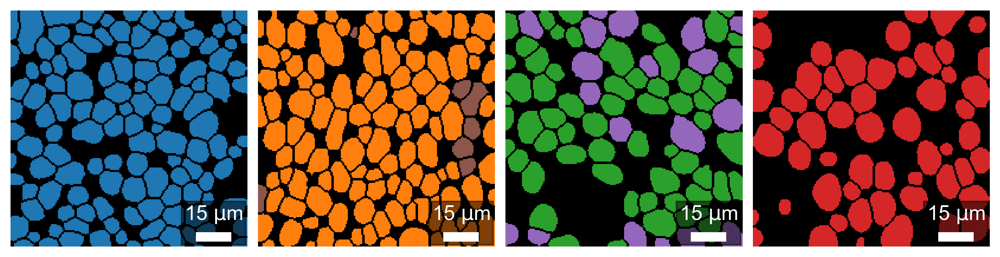

In [28]:
from importlib import reload  # Python 3.4+
reload(hph_adata)

save_name = str(out_dir / 'Fig2Q.pdf')
print(save_name)

hph_adata.adata_hph_mask_cluster_plot(
        adata=adata,
        cluster_name='leiden',
        plot_names=['', '', '', ''],
        hdf_ids=['MCF10a', 'A431', 'ZR-75-1', 'SKBR3'],
        save_name = save_name
    )

Restore all feature channels to plot heatmap per cell

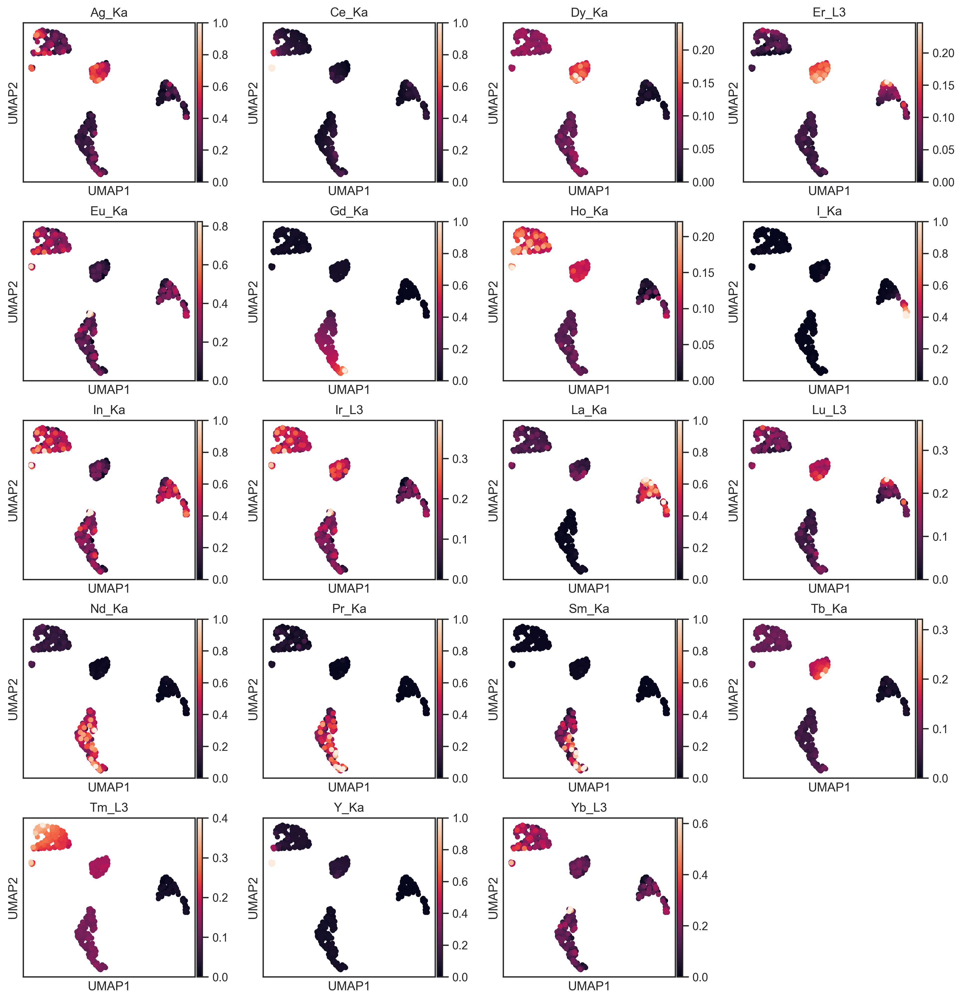

In [26]:
adata = adata.raw.to_adata()
adata.raw = adata

# Resetting the normalised data
normalised_data = adata.X.copy()
normalised_data = hph_adata.column_percentile_normalise_test(normalised_data, 2, 98, crop=False)
adata.X = normalised_data

with rc_context({'figure.figsize': (3, 3), 'figure.dpi': 300}):
    sc.pl.umap(
        adata, 
        color=adata.var_names, 
        ncols=4, 
        show=False, 
        use_raw=False, 
        size=100,
    )
plt.show()


Plots heatmap for all channels

C:\Users\MerrickS\OneDrive\Work\2_UZH\Papers\1_MEZ_XRF\data\processed\xrf\5b_cell_pellet_quantification\Fig2R_CellMarkerClusterHeatMap.svg


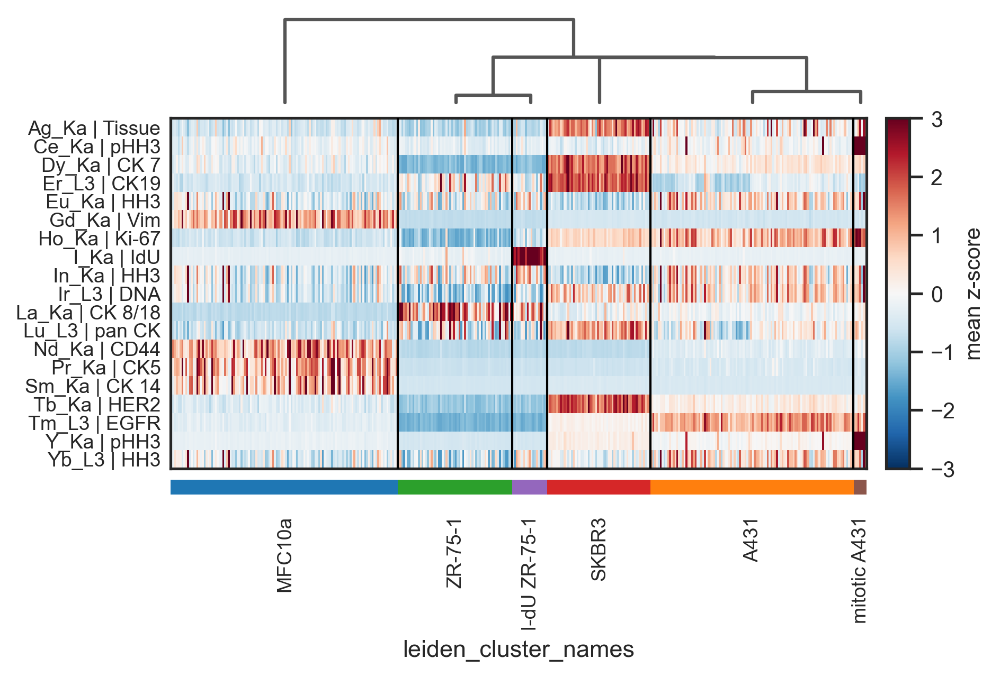

In [27]:
sns.set(font_scale=0.9)
sns.set_style("white")
sc.tl.dendrogram(adata, groupby = "leiden_cluster_names", cor_method='spearman')
adata.layers['scaled'] = sc.pp.scale(adata, copy=True).X
adata.var['xrf_edge'] = adata.var_names
adata.var_names = adata.var['longname']

# savename = out_dir / 'Fig2R_CellMarkerClusterHeatMap.svg'
# print(savename)
# plt.savefig(savename, bbox_inches='tight')

# Heatmap for all markers
with rc_context({'figure.dpi': 300}):
    axes = sc.pl.heatmap(
        adata, 
        var_names = adata.var_names,
        groupby='leiden_cluster_names', 
        layer='scaled', 
        vmin=-3, 
        vmax=3, 
        cmap='RdBu_r', 
        dendrogram=True, 
        swap_axes=True, 
        # use_raw=False,
        figsize=(6,4),
        var_group_rotation=90,
        show=False
        )
    axes['heatmap_ax'].figure.axes[-1].set_ylabel('mean z-score', size=10)
    
    savename = out_dir / 'Fig2R_CellMarkerClusterHeatMap.svg'
    print(savename)
    plt.savefig(savename, bbox_inches='tight')
    
    plt.show()
    
adata.var_names = adata.var['xrf_edge']

In [28]:
# Save annotated matched cells anndata object
adata.var_names = [str(i) for i in range(len(adata.var['longname']))] # to index
adata.write(out_dir.joinpath('cell_pellets_adata_matched_cell_analysed.h5ad'))

## Signal to noise calculation

In [29]:
image_n = 'raw'
mask_n = 'matched_cell_mask'
adata = hph.multiple_hph_to_adata(
    hdf_filepaths = hdf_filepaths, 
    image_n = image_n,
    mask_n = mask_n
)
adata.write(out_dir.joinpath('cell_pellets_adata_matched_cell_analysed_signal_to_noise.h5ad'))


... storing 'label_id' as categorical
... storing 'sample_name_ref' as categorical
... storing 'AB_panel' as categorical
... storing 'hph_mask_key' as categorical
... storing 'hph_image_key' as categorical
... storing 'hph_id' as categorical
... storing 'shortname' as categorical


In [30]:
adata.obs['Hz'] = 1

df_to_map = adata.var
df_to_map['var_name'] = df_to_map.index
df_to_map[['Symbol', 'Edge']] = df_to_map['var_name'].str.split('_', expand=True).rename(columns={0:'Symbol', 1:'Edge'})
df_to_map = pd.merge(df_to_map, df_periodic_table[['AtomicNumber', 'Element', 'Symbol']], on='Symbol')
df_to_map

,shortname,longname,var_name,Symbol,Edge,AtomicNumber,Element
0,Tissue,Ag_Ka | Tissue,Ag_Ka,Ag,Ka,47,Silver
1,pHH3,Ce_Ka | pHH3,Ce_Ka,Ce,Ka,58,Cerium
2,CK 7,Dy_Ka | CK 7,Dy_Ka,Dy,Ka,66,Dysprosium
3,CK19,Er_L3 | CK19,Er_L3,Er,L3,68,Erbium
4,HH3,Eu_Ka | HH3,Eu_Ka,Eu,Ka,63,Europium
5,Vim,Gd_Ka | Vim,Gd_Ka,Gd,Ka,64,Gadolinium
6,Ki-67,Ho_Ka | Ki-67,Ho_Ka,Ho,Ka,67,Holmium
7,IdU,I_Ka | IdU,I_Ka,I,Ka,53,Iodine
8,HH3,In_Ka | HH3,In_Ka,In,Ka,49,Indium
9,DNA,Ir_L3 | DNA,Ir_L3,Ir,L3,77,Iridium


In [31]:
df_signal_to_noise = pd.DataFrame()
for hz in adata.obs['Hz'].unique():
    row = {}
    row['Hz'] = hz
    adata_Hz = adata[adata.obs['Hz'] == hz]
    for var_name in adata_Hz.var_names:
        row['var_name'] = adata.var['var_name'][var_name]

        var_values = adata_Hz[:,var_name].X

        # Sample the max and mean signal in top and bottom (specified) % of cells
        non_zero_values = sorted(var_values[np.nonzero(var_values)])
        percentage = 1
        cell_sample = int(len(non_zero_values) / 100) * percentage
        row['minval'] = np.mean(non_zero_values[:cell_sample])
        row['maxval'] = np.max(non_zero_values[-cell_sample:])

        # Add rows to dataframe
        if df_signal_to_noise.empty:
            df_signal_to_noise = pd.DataFrame(columns=row.keys())            
        df_signal_to_noise = df_signal_to_noise.append(row, ignore_index=True)
            
# # Sort data types
df_signal_to_noise['var_name'] = df_signal_to_noise['var_name'].astype('category')
df_signal_to_noise['Hz'] = df_signal_to_noise['Hz'].astype('category')
df_signal_to_noise['minval'] = df_signal_to_noise['minval'].astype('float')
df_signal_to_noise['maxval'] = df_signal_to_noise['maxval'].astype('float')
df_signal_to_noise['signal-to-noise'] = (df_signal_to_noise['maxval'] - (df_signal_to_noise['minval']))

df_signal_to_noise = pd.merge(df_signal_to_noise, df_to_map, on='var_name')
df_signal_to_noise

C:\Users\MerrickS\Anaconda3\envs\mez-xrf\lib\site-packages\pandas\core\arrays\categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


,Hz,var_name,minval,maxval,signal-to-noise,shortname,longname,Symbol,Edge,AtomicNumber,Element
0,1,Ag_Ka,63.597668,303.333313,239.735645,Tissue,Ag_Ka | Tissue,Ag,Ka,47,Silver
1,1,Ce_Ka,9.564506,118.671837,109.107331,pHH3,Ce_Ka | pHH3,Ce,Ka,58,Cerium
2,1,Dy_Ka,29.017885,34.263447,5.245562,CK 7,Dy_Ka | CK 7,Dy,Ka,66,Dysprosium
3,1,Er_L3,91.368568,138.804932,47.436363,CK19,Er_L3 | CK19,Er,L3,68,Erbium
4,1,Eu_Ka,12.676461,36.610775,23.934314,HH3,Eu_Ka | HH3,Eu,Ka,63,Europium
5,1,Gd_Ka,12.682240,45.828728,33.146487,Vim,Gd_Ka | Vim,Gd,Ka,64,Gadolinium
6,1,Ho_Ka,50.285465,67.216721,16.931255,Ki-67,Ho_Ka | Ki-67,Ho,Ka,67,Holmium
7,1,I_Ka,13.870594,184.275024,170.404430,IdU,I_Ka | IdU,I,Ka,53,Iodine
8,1,In_Ka,87.682564,646.709045,559.026482,HH3,In_Ka | HH3,In,Ka,49,Indium
9,1,Ir_L3,140.576111,221.528107,80.951996,DNA,Ir_L3 | DNA,Ir,L3,77,Iridium


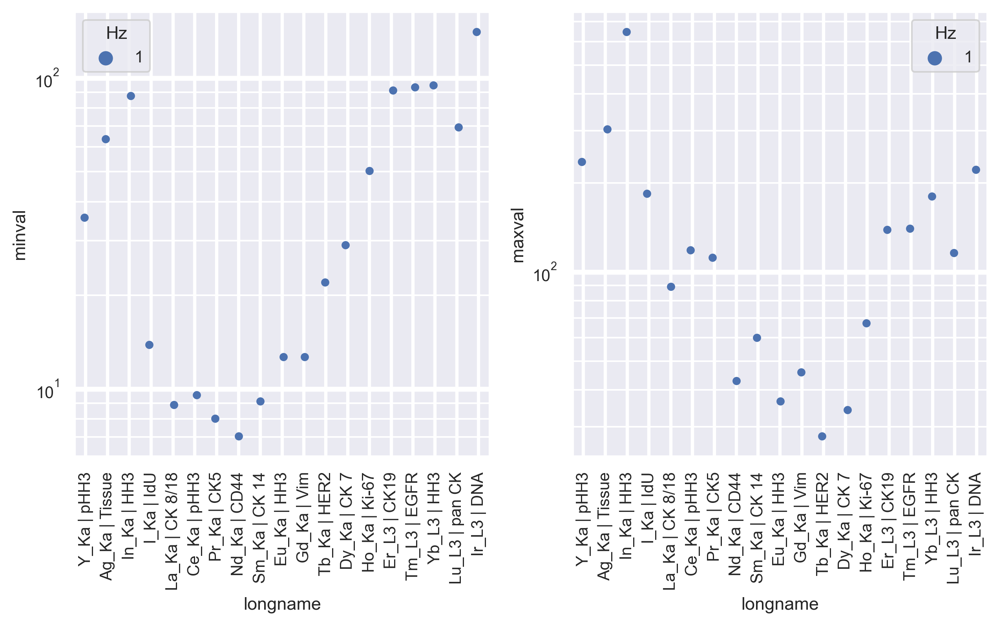

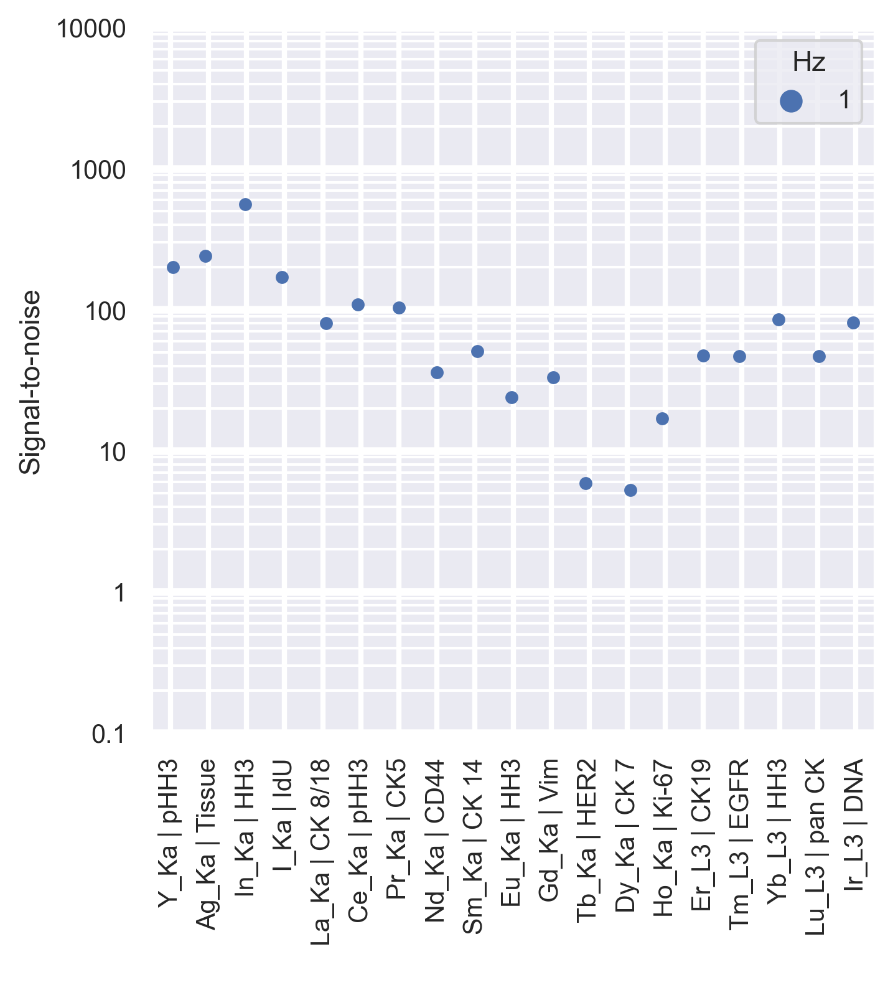

In [32]:
# Set seaborn
from matplotlib.ticker import ScalarFormatter
import matplotlib.ticker as ticker

sns.set_style("dark")

### Check max and min values
fig, axs = plt.subplots(ncols = 2, figsize=(10,5), dpi=300)

g = sns.stripplot(
    data = df_signal_to_noise,
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'minval',
    ax=axs[0],
    hue='Hz'
)
axs[0].tick_params(axis='x', rotation=90)

# Set scale
g.set(yscale="log")
#Set gridlines
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')

g = sns.stripplot(
    data = df_signal_to_noise,
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'maxval',
    ax=axs[1],
    hue='Hz',
)
axs[1].tick_params(axis='x', rotation=90)


# Set scale
g.set(yscale="log")
#Set gridlines
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')

# Sort shared legend
# axs[0].get_legend().remove()
# axs[1].get_legend().remove()
# plt.legend(title='Raster rate (Hz)', bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=90)#, ha='right')
plt.show()

### Plot signal to noise
fig, ax = plt.subplots(figsize=(5,5), dpi=300)
g = sns.stripplot(
    data = df_signal_to_noise,
    x = 'longname',
    order = df_to_map.sort_values('AtomicNumber')['longname'].to_list(),
    y = 'signal-to-noise',
    ax=ax,
    hue='Hz'
)
ax.set(yscale="log")
ax.set_ylim([0.1, 10000])
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))
g.grid(which='major', c='w', lw=3, axis='y')
g.grid(which='major', c='w', lw=2, axis='x')
g.grid(which='minor', c='w', lw=1, axis='y')
g.grid(which='minor', c='w', lw=1, axis='x')
plt.xticks(rotation=90)#, ha='right')
plt.ylabel('Signal-to-noise')
plt.xlabel(' ')
# plt.legend(title='Raster rate (Hz)', bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
plt.show()